# Modeling
1. We are Loading all preprocessed data which we prepared in EDA notebook i.e X_train,X_cv(cross validation) and X_test(without labels) we will upload x_test on kaggle to get model evaluation.

2. We are using **Accuracy** as evaluation metric and **Binary Crossentropy** for loss evaluation.

3. Content for each Model:

 a. Model Architecture

 b. Model Training

 c. Confusion matrix

 d. Tersorboard/ loss vs epoch and loss vs accuracy graphs

 e. Evalutatin model on Test data.

4. Callbacks used: 

  a. Reduce Learning rate on Platue.

  b. Reduce Learing rate by 5 percesnt.

  c. Model chekpoint callback for saving best model and its weights.

  d. Early stopping.

  e. Tensroboard




Mounting google drive


In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
import os
os.getcwd()
os.chdir('/content/drive/MyDrive/data/CS_2')
os.getcwd()

'/content/drive/MyDrive/data/CS_2'

### Importing libraries

In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud, STOPWORDS
import re
from bs4 import BeautifulSoup
import os
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import normalize
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Dense,Input,Activation
from tensorflow.keras.models import Model
import random as rn
import tensorflow as tf
import tensorflow.keras.backend as K
import datetime
from sklearn.preprocessing import OneHotEncoder
import tensorflow_hub as hub
import joblib
import pickle
from sklearn.metrics import f1_score,roc_auc_score,roc_auc_score,confusion_matrix,log_loss,roc_curve,auc

#### Loading Preprocessed data

In [7]:
# loading preprocessed data.
X_train_padded=joblib.load("X_train_padded.pkl")
x_cv_padded=joblib.load('X_cv_padded.pkl')
x_test_padded=joblib.load('X_test_padded.pkl')
embedding_matrix=joblib.load('Embedding_matrix.pkl')
token_glove=joblib.load('Token_glove.pkl')
# y_train_ohe=joblib.load('y_train_ohe.pkl')
# y_cv_ohe=joblib.load('y_cv_ohe.pkl')
y_train_ac=joblib.load('y_train_actual.pkl')
y_cv_ac=joblib.load('y_cv_actual.pkl')
x_train_pooled=joblib.load('X_train_pooled_output.pkl')
x_cv_pooled=joblib.load('X_cv_pooled_output.pkl')
x_test_pooled=joblib.load('X_test_pooled_output.pkl')
X_test_data=pd.read_csv('test_pre.csv')

In [8]:
# converting y_train to numpy arrays.
y_train_ac=np.array(y_train_ac)
y_cv_ac=np.array(y_cv_ac)

In [9]:
# printing vocab size
vocab_size=len(token_glove.word_index)+1
print(vocab_size)

246671


### Callbacks and function used

#### 1. Functions

In [10]:
#refrence: appliedroots.com
import sklearn
def find_best_threshold(threshould, fpr, tpr):
    t = threshould[np.argmax(tpr*(1-fpr))]
    # (tpr*(1-fpr)) will be maximum if your fpr is very low and tpr is very high
    print("the maximum value of tpr*(1-fpr)", max(tpr*(1-fpr)), "for threshold", np.round(t,3))
    return t

def predict_with_best_t(proba, threshould):
    predictions = []
    for i in proba:
        if i>=0.5:
            predictions.append(1)
        else:
            predictions.append(0)
    return predictions



def plot_roc_confusion_matrix_f1(model,x_tr,y_tr,x_te,y_te):
    y_predict_tr=model.predict(x_tr)
    fpr_tr,tpr_tr,thresold_tr=roc_curve(y_tr,y_predict_tr)
    y_predict_te=model.predict(x_te)
    fpr_te,tpr_te,thresold_te=roc_curve(y_te,y_predict_te)
    
    

    plt.figure(1)
    plt.figure(figsize=(7,4))
#     plt.subplot(3,1,1)

    plt.plot(fpr_tr, tpr_tr, label="train AUC ="+str(auc(fpr_tr, tpr_tr)))
    plt.plot(fpr_te, tpr_te, label="test AUC ="+str(auc(fpr_te, tpr_te)))
    auc_score_test=auc(fpr_te, tpr_te)

    plt.legend()
    plt.xlabel("fpr")
    plt.ylabel("tpr")
    plt.title("ROC_CURVE")
    plt.grid(True)
    plt.show()

    train_best_threshold=find_best_threshold(thresold_tr,fpr_tr,tpr_tr)
    test_best_threshold=find_best_threshold(thresold_te,fpr_te,tpr_te)

    prediction_tr=predict_with_best_t(y_predict_tr,train_best_threshold)
    prediction_te=predict_with_best_t(y_predict_te,test_best_threshold)
    
    plt.figure(2)
    plt.figure(figsize=(5,5))

    plt.subplot(2,1,1)
    conf_mat = pd.DataFrame(confusion_matrix(y_tr, prediction_tr))

    sns.heatmap(conf_mat, annot = True, fmt= 'd',annot_kws={"size": 15}, xticklabels= ['Predicted No', 'Predicted Yes'], yticklabels= ['Actaual No','Actual Yes'])
    plt.title('confusion matrix of train data')
    plt.xlabel('Actual')
    plt.ylabel('predicted')
    plt.show()
    plt.figure(figsize=(5,5))
    plt.subplot(2,1,2)
    conf_mat_te = pd.DataFrame(sklearn.metrics.confusion_matrix(y_te,prediction_te))

    sns.heatmap(conf_mat_te, annot = True, fmt= 'd',annot_kws={"size": 15}, xticklabels= ['Predicted No', 'Predicted Yes'], yticklabels= ['Actaual No','Actual Yes'])
    plt.title('confusion matrix of test data')
    plt.xlabel('Actual')
    plt.ylabel('predicted')
    plt.show()
    
     

    print('train_auc_score =',auc(fpr_tr, tpr_tr))
    print('validation_auc_score =',auc(fpr_te, tpr_te))
    print('-'*110)
    print('logloss Train:--',sklearn.metrics.log_loss(y_tr,prediction_tr))
    print('logloss Test:--',sklearn.metrics.log_loss(y_te,prediction_te))
    print('-'*110)
    print('F1 Train:--',sklearn.metrics.f1_score(y_tr,prediction_tr))
    print('F1 Test:--',sklearn.metrics.f1_score(y_te,prediction_te))
    print('Accuracy Train:--',sklearn.metrics.accuracy_score(y_tr,prediction_tr))
    print('Accuracy Test:--',sklearn.metrics.accuracy_score(y_te,prediction_te))



def predict_test_thre(proba, threshould):
    predictions = []
    for i in proba:
        if i>=0.5:
            predictions.append(1)
        else:
            predictions.append(0)
    return predictions

def Test_prediction(model,x_tr):
  y_predict_tr=model.predict(x_tr)
  pred=predict_test_thre(y_predict_tr, threshould=0.5)
  return pred

#### 2. Callbacks

In [ ]:
def learning_rate_change(epoch, lr):
    
    if epoch % 3 == 0:
        return lr * 0.95
    else:
        return lr
#learing rate condition 1
reduce_lr_1 = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_accuracy', factor=0.9,
                              patience=0, min_lr=0.0001)

lr_scheduler_2 = tf.keras.callbacks.LearningRateScheduler(learning_rate_change, verbose=3)

#save model
filepath="best_model/best_model_1.h5"
model_checkpoint = tf.keras.callbacks.ModelCheckpoint(
    filepath=filepath,
    save_weights_only=True,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True)

#early stoping
early_stop=tf.keras.callbacks.EarlyStopping(
    monitor='val_accuracy', min_delta=0, patience=3, verbose=3,
    mode='auto', baseline=None, restore_best_weights=False)


#tensorboard
log_dir="logs_model_1"+ datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir,histogram_freq=1, 
                                                      write_graph=True,write_grads=True)

callback_list=[reduce_lr_1,lr_scheduler_2]

dot_img_file = '/model_1.png'
tf.keras.utils.plot_model(model, to_file=dot_img_file, show_shapes=True)

Loading Tensorboard

In [ ]:
%load_ext tensorboard

### Model_1 BERT embeddings

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 768)]             0         
                                                                 
 dense (Dense)               (None, 512)               393728    
                                                                 
 dense_1 (Dense)             (None, 265)               135945    
                                                                 
 dropout (Dropout)           (None, 265)               0         
                                                                 
 batch_normalization (BatchN  (None, 265)              1060      
 ormalization)                                                   
                                                                 
 dense_2 (Dense)             (None, 128)               34048     
                                                             

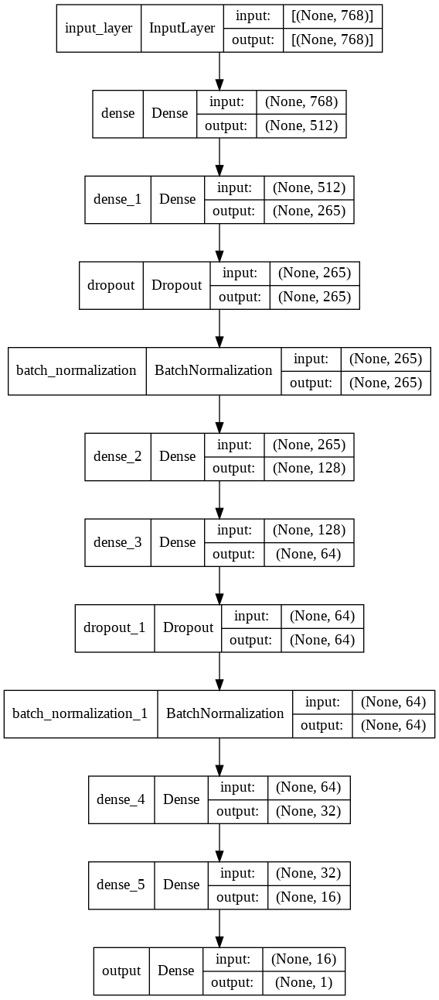

In [ ]:
  ##create an NN and
input=Input(shape=(768,),name="input_layer")

dense_1 = Dense(512, activation="relu",kernel_initializer=tf.keras.initializers.HeNormal())(input)


dense_2 = Dense(265,activation="relu",kernel_initializer=tf.keras.initializers.HeNormal())(dense_1)

drop_1 = tf.keras.layers.Dropout(0.3)(dense_2)
batch_1=tf.keras.layers.BatchNormalization()(drop_1)

dense_3 = Dense(128,activation="relu", kernel_initializer=tf.keras.initializers.HeNormal())(batch_1)

dense_4 = Dense(64,activation="relu", kernel_initializer=tf.keras.initializers.HeNormal())(dense_3)

drop_2 = tf.keras.layers.Dropout(0.3)(dense_4)
batch_2=tf.keras.layers.BatchNormalization()(drop_2)

dense_5 = Dense(32,activation="relu", kernel_initializer=tf.keras.initializers.HeNormal())(batch_2)

dense_6 = Dense(16,activation="relu", kernel_initializer=tf.keras.initializers.HeNormal())(dense_5)



output = Dense(1, activation='sigmoid', name='output')(dense_6)


model = Model(inputs=input,outputs=[output])

print(model.summary())


optimizer = tf.keras.optimizers.Adam(
    learning_rate=0.0001, beta_1=0.9, beta_2=0.999, epsilon=1e-07)

def learning_rate_change(epoch, lr):
    
    if epoch % 3 == 0:
        return lr * 0.95
    else:
        return lr
#learing rate condition 1
reduce_lr_1 = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_accuracy', factor=0.9,
                              patience=0, min_lr=0.0001)

lr_scheduler_2 = tf.keras.callbacks.LearningRateScheduler(learning_rate_change, verbose=3)


#save model
filepath="best_model/best_model_BERT.h5"
model_checkpoint = tf.keras.callbacks.ModelCheckpoint(
    filepath=filepath,
    save_weights_only=True,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True)

#early stoping
early_stop=tf.keras.callbacks.EarlyStopping(
    monitor='val_accuracy', min_delta=0, patience=5, verbose=3,
    mode='auto', baseline=None, restore_best_weights=False)


#tensorboard
log_dir="logs_model_BERT :-"+ datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir,histogram_freq=1, 
                                                      write_graph=True,write_grads=True)





callback_list=[reduce_lr_1,lr_scheduler_2,model_checkpoint,early_stop,tensorboard_callback]

model.compile(optimizer=optimizer, loss="binary_crossentropy",metrics=['accuracy'])


dot_img_file = '/model_BERT.png'
tf.keras.utils.plot_model(model, to_file=dot_img_file, show_shapes=True)

In [ ]:
model.fit(x_train_pooled,y_train_ac,epochs=40, validation_data=(x_cv_pooled,y_cv_ac), batch_size=15,callbacks=callback_list)


Epoch 00001: LearningRateScheduler setting learning rate to 9.499999760009814e-05.
Epoch 1/40
815/815 [==============================] - 9s 8ms/step - loss: 0.7464 - accuracy: 0.5504 - val_loss: 0.6267 - val_accuracy: 0.6512 - lr: 9.5000e-05

Epoch 00002: LearningRateScheduler setting learning rate to 9.499999578110874e-05.
Epoch 2/40
815/815 [==============================] - 6s 8ms/step - loss: 0.6562 - accuracy: 0.6326 - val_loss: 0.6150 - val_accuracy: 0.6684 - lr: 9.5000e-05

Epoch 00003: LearningRateScheduler setting learning rate to 9.499999578110874e-05.
Epoch 3/40
815/815 [==============================] - 6s 8ms/step - loss: 0.6424 - accuracy: 0.6455 - val_loss: 0.6028 - val_accuracy: 0.6738 - lr: 9.5000e-05

Epoch 00004: LearningRateScheduler setting learning rate to 9.02499959920533e-05.
Epoch 4/40
815/815 [==============================] - 6s 7ms/step - loss: 0.6311 - accuracy: 0.6588 - val_loss: 0.6162 - val_accuracy: 0.6767 - lr: 9.0250e-05

Epoch 00005: LearningRateSch

<Figure size 432x288 with 0 Axes>

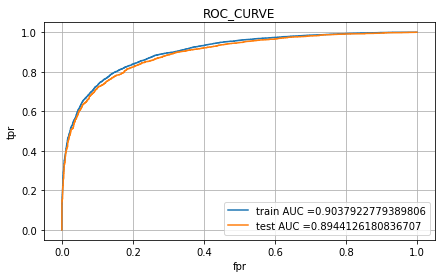

the maximum value of tpr*(1-fpr) 0.6795687266301779 for threshold 0.278
the maximum value of tpr*(1-fpr) 0.6645546558704454 for threshold 0.247


<Figure size 432x288 with 0 Axes>

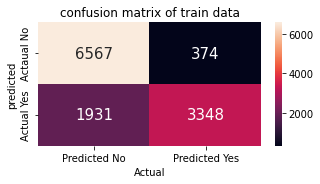

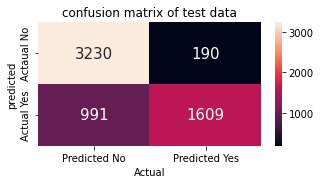

train_auc_score = 0.9037922779389806
validation_auc_score = 0.8944126180836707
--------------------------------------------------------------------------------------------------------------
logloss Train:-- 6.514908235655321
logloss Test:-- 6.7758217351995444
--------------------------------------------------------------------------------------------------------------
F1 Train:-- 0.743917342517498
F1 Test:-- 0.7315298931575357
Accuracy Train:-- 0.8113747954173486
Accuracy Test:-- 0.8038205980066445


In [ ]:
plot_roc_confusion_matrix_f1(model,x_train_pooled,y_train_ac,x_cv_pooled,y_cv_ac)

Tensorboard

In [ ]:
%tensorboard --logdir '/content/drive/MyDrive/data/CS_2/logs_model_BERT :-20211206-064243'

<IPython.core.display.Javascript object>

In [ ]:
# saving BERT Model
model.save('best_model/BERT_model.h5')

Model evaluation on test data

In [ ]:
bert_model=tf.keras.models.load_model("best_model/BERT_model.h5")

In [ ]:
bert_predictions=Test_prediction(bert_model,x_test_pooled)
X_test_data['label']=bert_predictions
sub_bert=X_test_data[['id','label']]

In [ ]:
sub_bert.to_csv('sub_bert.csv',index=False)

submission screenshot
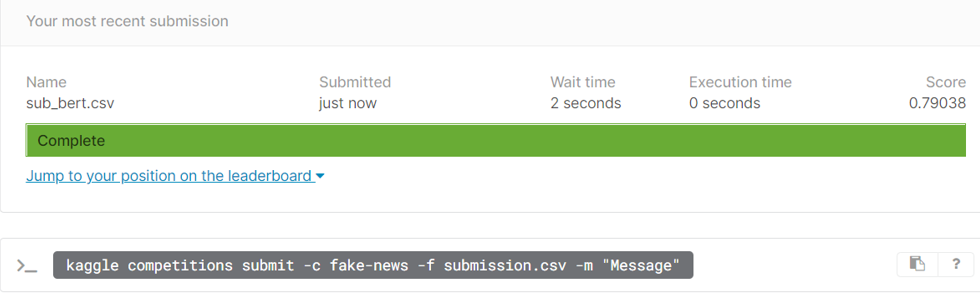

 
 ### Model_2 
 #### Neural network



Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 1014)]            0         
                                                                 
 embeddingLayer (Embedding)  (None, 1014, 300)         74001300  
                                                                 
 flatten (Flatten)           (None, 304200)            0         
                                                                 
 dense (Dense)               (None, 128)               38937728  
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 batch_normalization (BatchN  (None, 128)              512       
 ormalization)                                                   
                                                             

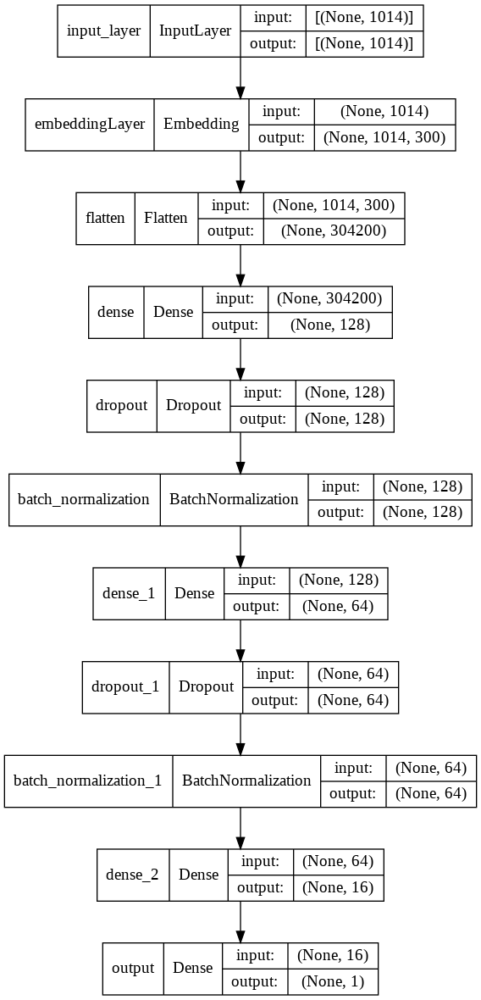

In [ ]:
import tensorflow as tf



input_m = Input(shape=(1014,),name='input_layer')
# embedding layer
embeddings = tf.keras.layers.Embedding(vocab_size, 300,
                       weights=[embedding_matrix],
                       input_length=1014,
                       trainable=False,
                       name="embeddingLayer")(input_m)


flatten_layer=tf.keras.layers.Flatten()(embeddings)

dense_1 = Dense(128, activation="relu",kernel_initializer=tf.keras.initializers.HeNormal())(flatten_layer)

drop_1 = tf.keras.layers.Dropout(0.5)(dense_1)
batch_1=tf.keras.layers.BatchNormalization()(drop_1)

dense_3 = Dense(64,activation="relu",kernel_initializer=tf.keras.initializers.HeNormal())(batch_1)

drop_2 = tf.keras.layers.Dropout(0.5)(dense_3)
batch_2=tf.keras.layers.BatchNormalization()(drop_2)

dense_5 = Dense(16,activation="relu", kernel_initializer=tf.keras.initializers.HeNormal())(batch_2)


output = Dense(1, activation='sigmoid', name='output')(dense_5)

model = Model(inputs=input_m,outputs=[output])

print(model.summary())


optimizer = tf.keras.optimizers.Adam(
    learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07)


#save model
filepath="best_model/best_model_Neural_n.h5"
model_checkpoint = tf.keras.callbacks.ModelCheckpoint(
    filepath=filepath,
    save_weights_only=True,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True)



#tensorboard
log_dir="logs_model_neural_N :-"+ datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir,histogram_freq=1, 
                                                      write_graph=True,write_grads=True)


# callback_list=[reduce_lr_1,lr_scheduler_2,model_checkpoint,early_stop,tensorboard_callback]
def learning_rate_change(epoch, lr):
    
    if epoch % 3 == 0:
        return lr * 0.95
    else:
        return lr
#learing rate condition 1
reduce_lr_1 = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_accuracy', factor=0.9,
                              patience=0, min_lr=0.0001)

lr_scheduler_2 = tf.keras.callbacks.LearningRateScheduler(learning_rate_change, verbose=3)

#early stoping
early_stop=tf.keras.callbacks.EarlyStopping(
    monitor='val_accuracy', min_delta=0, patience=5, verbose=3,
    mode='auto', baseline=None, restore_best_weights=False)

callback_list=[reduce_lr_1,lr_scheduler_2,early_stop,model_checkpoint]




model.compile(optimizer=optimizer, loss="binary_crossentropy",metrics=['accuracy'])

dot_img_file = '/model_nural_n.png'
tf.keras.utils.plot_model(model, to_file=dot_img_file, show_shapes=True)

In [ ]:
model_nn=model.fit(X_train_padded,y_train_ac,epochs=40, validation_data=(x_cv_padded,y_cv_ac), batch_size=15,callbacks=callback_list)


Epoch 00001: LearningRateScheduler setting learning rate to 0.0009500000451225787.
Epoch 1/40
815/815 [==============================] - 30s 35ms/step - loss: 0.6112 - accuracy: 0.6679 - val_loss: 0.4761 - val_accuracy: 0.7821 - lr: 9.5000e-04

Epoch 00002: LearningRateScheduler setting learning rate to 0.0009500000160187483.
Epoch 2/40
815/815 [==============================] - 24s 30ms/step - loss: 0.4628 - accuracy: 0.7847 - val_loss: 0.4077 - val_accuracy: 0.8269 - lr: 9.5000e-04

Epoch 00003: LearningRateScheduler setting learning rate to 0.0009500000160187483.
Epoch 3/40
815/815 [==============================] - 24s 30ms/step - loss: 0.3690 - accuracy: 0.8422 - val_loss: 0.3630 - val_accuracy: 0.8488 - lr: 9.5000e-04

Epoch 00004: LearningRateScheduler setting learning rate to 0.0009025000152178108.
Epoch 4/40
815/815 [==============================] - 22s 27ms/step - loss: 0.2937 - accuracy: 0.8794 - val_loss: 0.3519 - val_accuracy: 0.8478 - lr: 8.1225e-04

Epoch 00005: Learni

<Figure size 432x288 with 0 Axes>

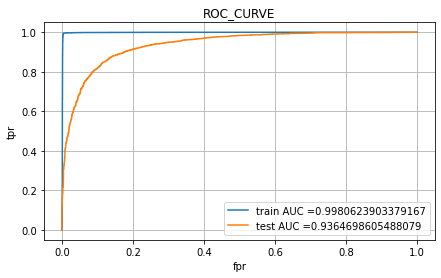

the maximum value of tpr*(1-fpr) 0.9905775245957873 for threshold 0.245
the maximum value of tpr*(1-fpr) 0.7541412505623033 for threshold 0.314


<Figure size 432x288 with 0 Axes>

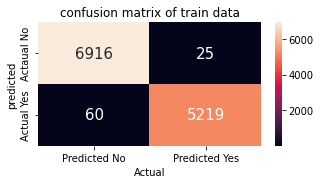

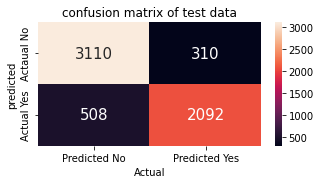

train_auc_score = 0.9980623903379167
validation_auc_score = 0.9364698605488079
--------------------------------------------------------------------------------------------------------------
logloss Train:-- 0.2402468071606526
logloss Test:-- 4.693183881435266
--------------------------------------------------------------------------------------------------------------
F1 Train:-- 0.9919224555735057
F1 Test:-- 0.8364654138344662
Accuracy Train:-- 0.9930441898527005
Accuracy Test:-- 0.8641196013289036


In [ ]:
plot_roc_confusion_matrix_f1(model,X_train_padded,y_train_ac,x_cv_padded,y_cv_ac)

In [ ]:
# saving BERT Model
model.save('best_model/NN_model.h5')

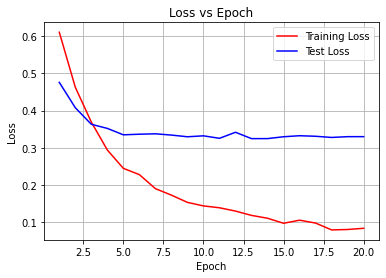

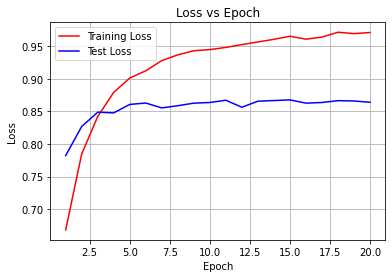

In [ ]:
training_loss = model_nn.history['loss']
test_loss = model_nn.history['val_loss']
train_acc=model_nn.history['accuracy']
test_acc=model_nn.history['val_accuracy']

# Create count of the number of epochs
epoch_count = range(1, len(training_loss) + 1)
plt.figure(1)
# Visualize loss history
plt.plot(epoch_count, training_loss, 'r-',label="Train_loss")
plt.plot(epoch_count, test_loss, 'b-',label='Test_loss')
plt.legend(['Training Loss', 'Test Loss'])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs Epoch')
plt.grid()
plt.show()

plt.figure(2)

# Visualize loss history
plt.plot(epoch_count, train_acc, 'r-',label="Train_accuracy")
plt.plot(epoch_count, test_acc, 'b-',label='Test_accuracy')
plt.legend(['Training Loss', 'Test Loss'])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs Epoch')
plt.grid()
plt.show()

In [ ]:
NN_model=tf.keras.models.load_model("best_model/NN_model.h5")

In [ ]:
NN_predictions=Test_prediction(NN_model,x_test_padded)
X_test_data['label']=NN_predictions
sub_NN=X_test_data[['id','label']]
sub_NN.to_csv('sub_NN.csv',index=False)

submission screenshot
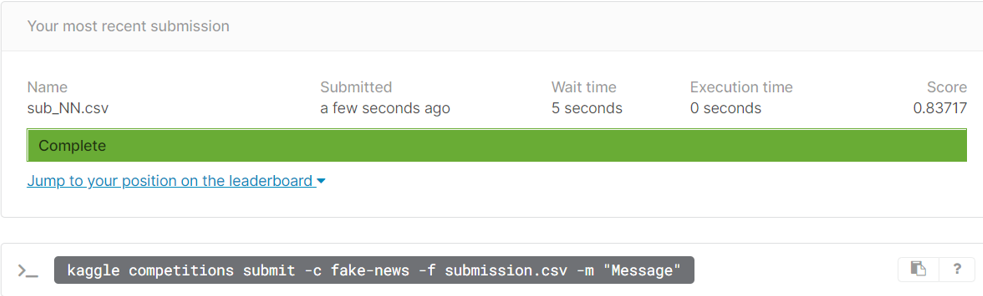

### Model_3 
#### CNN

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_layer (InputLayer)       [(None, 1014)]       0           []                               
                                                                                                  
 embeddingLayer (Embedding)     (None, 1014, 300)    74001300    ['input_layer[0][0]']            
                                                                                                  
 conv_1d_a (Conv1D)             (None, 1012, 5)      4505        ['embeddingLayer[0][0]']         
                                                                                                  
 conv_1d_b (Conv1D)             (None, 1012, 5)      4505        ['embeddingLayer[0][0]']         
                                                                                            

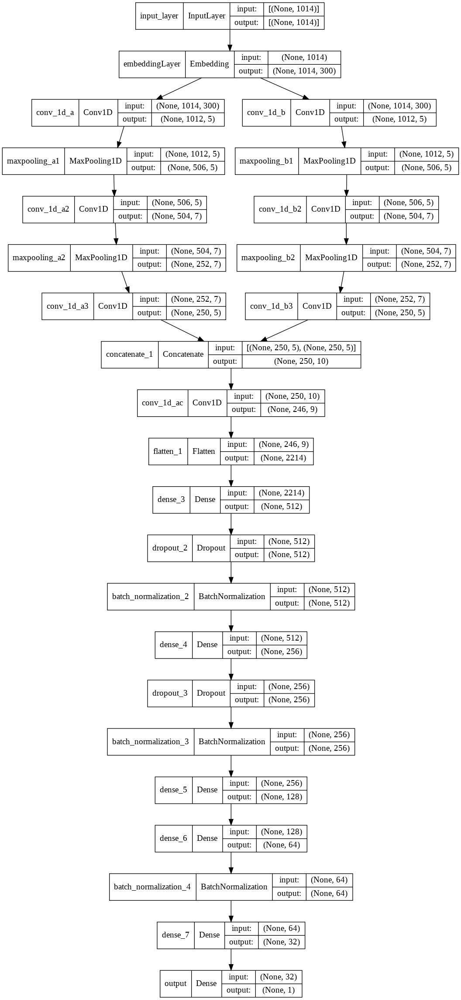

In [ ]:
# input layer
input = Input(shape=(1014,),name='input_layer')
# embedding layer
embeddings = tf.keras.layers.Embedding(vocab_size, 300,
                       weights=[embedding_matrix],
                       input_length=1014,
                       trainable=False,
                       name="embeddingLayer")(input)
conv_1d_a = tf.keras.layers.Conv1D(filters=5,
                   kernel_size = 3,
                   activation='relu',
                   name="conv_1d_a")(embeddings)


maxpooling_a1 = tf.keras.layers.MaxPool1D(name="maxpooling_a1")(conv_1d_a)

conv_1d_a2 = tf.keras.layers.Conv1D(filters=7,
                   kernel_size = 3,
                   activation='relu',
                   name="conv_1d_a2")(maxpooling_a1)

maxpooling_a2 = tf.keras.layers.MaxPool1D(name="maxpooling_a2")(conv_1d_a2)

conv_1d_a3 = tf.keras.layers.Conv1D(filters=5,
                   kernel_size = 3,
                   activation='relu',
                   name="conv_1d_a3")(maxpooling_a2)

conv_1d_b = tf.keras.layers.Conv1D(filters=5,
                   kernel_size = 3,
                   activation='relu',
                   name="conv_1d_b")(embeddings)


maxpooling_b1 = tf.keras.layers.MaxPool1D(name="maxpooling_b1")(conv_1d_b)

conv_1d_b2 = tf.keras.layers.Conv1D(filters=7,
                   kernel_size = 3,
                   activation='relu',
                   name="conv_1d_b2")(maxpooling_b1)

maxpooling_b2 = tf.keras.layers.MaxPool1D(name="maxpooling_b2")(conv_1d_b2)

conv_1d_b3 = tf.keras.layers.Conv1D(filters=5,
                   kernel_size = 3,
                   activation='relu',
                   name="conv_1d_b3")(maxpooling_b2)


# https://intellipaat.com/community/3409/how-to-concatenate-two-layers-in-keras
concat_1 = tf.keras.layers.Concatenate(name="concatenate_1")([conv_1d_a3,conv_1d_b3])

conv_1d_c = tf.keras.layers.Conv1D(filters=9,
                   kernel_size = 5,
                   activation='relu',
                   name="conv_1d_ac")(concat_1)

flatten_layer=tf.keras.layers.Flatten()(conv_1d_c)


dense_1 = Dense(512, activation="relu",kernel_initializer=tf.keras.initializers.HeNormal())(flatten_layer)

drop_1 = tf.keras.layers.Dropout(0.3)(dense_1)
batch_1=tf.keras.layers.BatchNormalization()(drop_1)

dense_3 = Dense(256,activation="relu",kernel_initializer=tf.keras.initializers.HeNormal())(batch_1)

drop_2 = tf.keras.layers.Dropout(0.5)(dense_3)
batch_2=tf.keras.layers.BatchNormalization()(drop_2)

dense_5 = Dense(128,activation="relu", kernel_initializer=tf.keras.initializers.HeNormal())(batch_2)
dense_6 = Dense(64,activation="relu", kernel_initializer=tf.keras.initializers.HeNormal())(dense_5)
batch_3=tf.keras.layers.BatchNormalization()(dense_6)
dense_7 = Dense(32,activation="relu", kernel_initializer=tf.keras.initializers.HeNormal())(batch_3)
output = Dense(1, activation='sigmoid', name='output')(dense_7)

model = Model(inputs=input,outputs=[output])

print(model.summary())


optimizer = tf.keras.optimizers.Adam(
    learning_rate=0.0001, beta_1=0.9, beta_2=0.999, epsilon=1e-07)



#save model
filepath="best_model/best_model_CNN_a.h5"
model_checkpoint = tf.keras.callbacks.ModelCheckpoint(
    filepath=filepath,
    save_weights_only=True,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True)



#tensorboard
log_dir="logs_model_CNN_a :-"+ datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir,histogram_freq=1, 
                                                      write_graph=True,write_grads=True)


# callback_list=[reduce_lr_1,lr_scheduler_2,model_checkpoint,early_stop,tensorboard_callback]
def learning_rate_change(epoch, lr):
    
    if epoch % 3 == 0:
        return lr * 0.95
    else:
        return lr
#learing rate condition 1
reduce_lr_1 = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_accuracy', factor=0.9,
                              patience=0, min_lr=0.0001)

lr_scheduler_2 = tf.keras.callbacks.LearningRateScheduler(learning_rate_change, verbose=3)

#early stoping
early_stop=tf.keras.callbacks.EarlyStopping(
    monitor='val_accuracy', min_delta=0, patience=5, verbose=3,
    mode='auto', baseline=None, restore_best_weights=False)

callback_list=[reduce_lr_1,lr_scheduler_2,early_stop,model_checkpoint]




model.compile(optimizer=optimizer, loss="binary_crossentropy",metrics=['accuracy'])

dot_img_file = '/model_CNN_a.png'
tf.keras.utils.plot_model(model, to_file=dot_img_file, show_shapes=True)

In [ ]:
model_cnn_a=model.fit(X_train_padded,y_train_ac,epochs=50, validation_data=(x_cv_padded,y_cv_ac), batch_size=15,callbacks=callback_list)


Epoch 00001: LearningRateScheduler setting learning rate to 9.499999760009814e-05.
Epoch 1/50
815/815 [==============================] - 25s 20ms/step - loss: 0.7179 - accuracy: 0.5895 - val_loss: 0.6488 - val_accuracy: 0.6472 - lr: 9.5000e-05

Epoch 00002: LearningRateScheduler setting learning rate to 9.499999578110874e-05.
Epoch 2/50
815/815 [==============================] - 17s 21ms/step - loss: 0.6665 - accuracy: 0.6160 - val_loss: 0.6260 - val_accuracy: 0.6497 - lr: 9.5000e-05

Epoch 00003: LearningRateScheduler setting learning rate to 9.499999578110874e-05.
Epoch 3/50
815/815 [==============================] - 17s 21ms/step - loss: 0.6420 - accuracy: 0.6393 - val_loss: 0.5871 - val_accuracy: 0.6854 - lr: 9.5000e-05

Epoch 00004: LearningRateScheduler setting learning rate to 9.02499959920533e-05.
Epoch 4/50
815/815 [==============================] - 17s 21ms/step - loss: 0.5921 - accuracy: 0.6795 - val_loss: 0.5197 - val_accuracy: 0.7447 - lr: 9.0250e-05

Epoch 00005: Learnin

<Figure size 432x288 with 0 Axes>

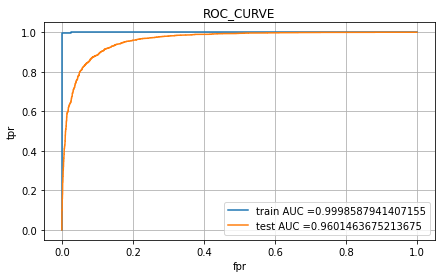

the maximum value of tpr*(1-fpr) 0.9946255805467122 for threshold 0.725
the maximum value of tpr*(1-fpr) 0.8041662168241116 for threshold 0.68


<Figure size 432x288 with 0 Axes>

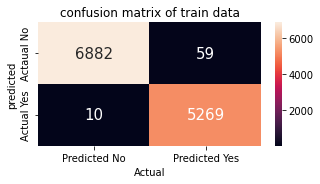

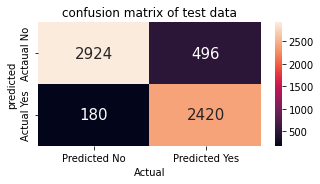

train_auc_score = 0.9998587941407155
validation_auc_score = 0.9601463675213675
--------------------------------------------------------------------------------------------------------------
logloss Train:-- 0.19502641141548532
logloss Test:-- 3.878506552040698
--------------------------------------------------------------------------------------------------------------
F1 Train:-- 0.9934948618836619
F1 Test:-- 0.8774474256707759
Accuracy Train:-- 0.9943535188216039
Accuracy Test:-- 0.8877076411960133


In [ ]:
plot_roc_confusion_matrix_f1(model,X_train_padded,y_train_ac,x_cv_padded,y_cv_ac)

In [ ]:
# saving BERT Model
model.save('best_model/CNN_a_model.h5')

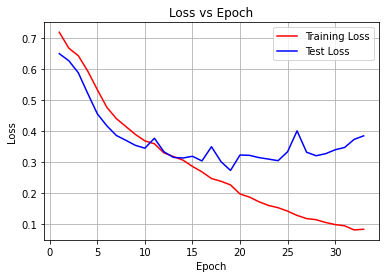

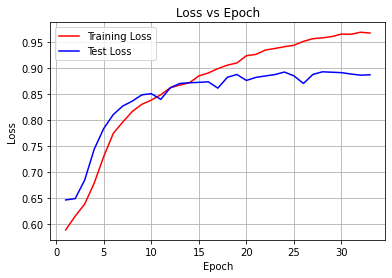

In [ ]:
training_loss = model_cnn_a.history['loss']
test_loss = model_cnn_a.history['val_loss']
train_acc=model_cnn_a.history['accuracy']
test_acc=model_cnn_a.history['val_accuracy']

# Create count of the number of epochs
epoch_count = range(1, len(training_loss) + 1)
plt.figure(1)
# Visualize loss history
plt.plot(epoch_count, training_loss, 'r-',label="Train_loss")
plt.plot(epoch_count, test_loss, 'b-',label='Test_loss')
plt.legend(['Training Loss', 'Test Loss'])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs Epoch')
plt.grid()
plt.show()

plt.figure(2)

# Visualize loss history
plt.plot(epoch_count, train_acc, 'r-',label="Train_accuracy")
plt.plot(epoch_count, test_acc, 'b-',label='Test_accuracy')
plt.legend(['Training Loss', 'Test Loss'])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs Epoch')
plt.grid()
plt.show()

In [ ]:
CNN_a_model=tf.keras.models.load_model("best_model/CNN_a_model.h5")
CNN_a_predictions=Test_prediction(CNN_a_model,x_test_padded)
X_test_data['label']=CNN_a_predictions
sub_NN=X_test_data[['id','label']]
sub_NN.to_csv('sub_CNN_a.csv',index=False)

submission screenshot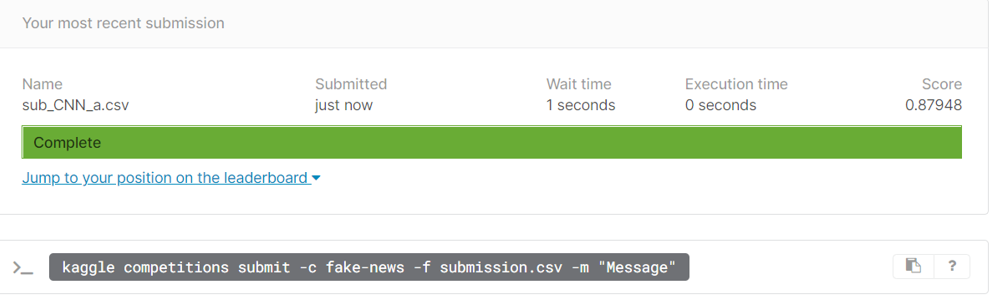

### Model_4 CNN_b

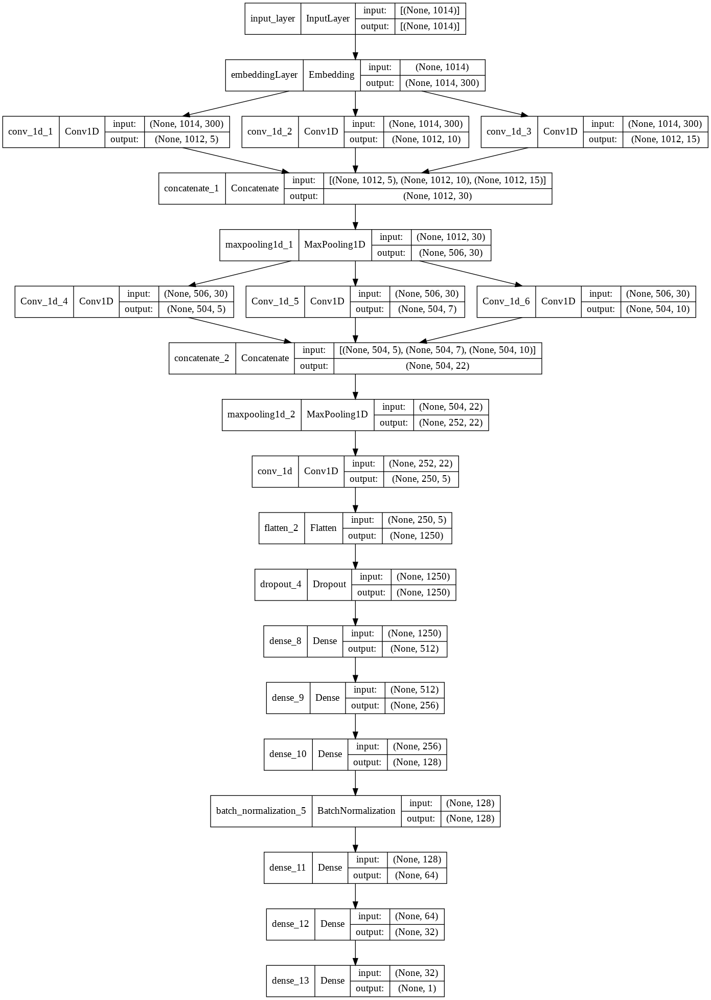

In [ ]:
# input layer
input_m = Input(shape=(1014,),name='input_layer')
# embedding layer
embeddings = tf.keras.layers.Embedding(vocab_size, 300,
                       weights=[embedding_matrix],
                       input_length=1014,
                       trainable=False,
                       name="embeddingLayer")(input_m)
conv_1d_1 = tf.keras.layers.Conv1D(filters=5,
                   kernel_size = 3,
                   activation='relu',
                   name="conv_1d_1")(embeddings)
conv_1d_2 = tf.keras.layers.Conv1D(filters=10,
                   kernel_size = 3,
                   activation='relu',
                   name="conv_1d_2")(embeddings)
conv_1d_3 = tf.keras.layers.Conv1D(filters=15,
                   kernel_size = 3,
                   activation='relu',
                   name="conv_1d_3")(embeddings)
# https://intellipaat.com/community/3409/how-to-concatenate-two-layers-in-keras
concatenate_1 = tf.keras.layers.Concatenate(name="concatenate_1")([conv_1d_1,conv_1d_2,conv_1d_3])
maxpooling_1 = tf.keras.layers.MaxPool1D(name="maxpooling1d_1")(concatenate_1)
conv_1d_4 = tf.keras.layers.Conv1D(filters=5,
                   kernel_size = 3,
                   activation='relu',
                   name="Conv_1d_4")(maxpooling_1)
conv_1d_5 = tf.keras.layers.Conv1D(filters=7,
                   kernel_size = 3,
                   activation='relu',
                   name="Conv_1d_5")(maxpooling_1)
conv_1d_6 = tf.keras.layers.Conv1D(filters=10,
                   kernel_size = 3,
                   activation='relu',
                   name="Conv_1d_6")(maxpooling_1)
concatenate_2 = tf.keras.layers.Concatenate(name="concatenate_2")([conv_1d_4,conv_1d_5,conv_1d_6])
maxpooling_2 = tf.keras.layers.MaxPool1D(name="maxpooling1d_2")(concatenate_2)
conv_1d= tf.keras.layers.Conv1D(filters=5,
                   kernel_size = 3,
                   activation='relu',
                   name="conv_1d")(maxpooling_2)
flatten_layer=tf.keras.layers.Flatten()(conv_1d)

dropout_layer=tf.keras.layers.Dropout(0.1)(flatten_layer)
layer1 = Dense(512,activation='relu',kernel_initializer=tf.keras.initializers.HeNormal())(dropout_layer)
layer2 = Dense(256,activation='relu',kernel_initializer=tf.keras.initializers.HeNormal())(layer1)
layer3 = Dense(128,activation='relu',kernel_initializer=tf.keras.initializers.HeNormal())(layer2)
batch_n=tf.keras.layers.BatchNormalization()(layer3)
layer4 = Dense(64,activation='relu',kernel_initializer=tf.keras.initializers.HeNormal())(batch_n)
layer5 = Dense(32,activation='relu',kernel_initializer=tf.keras.initializers.HeNormal())(layer4)



#output layer
output = Dense(1,activation='sigmoid',kernel_initializer=tf.keras.initializers.glorot_normal(seed=0))(layer5)
#Creating a model
model = Model(inputs=input_m,outputs=output)
optimizer = tf.keras.optimizers.Adam(
    learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07)



#save model
filepath="best_model/best_model_CNN_b.h5"
model_checkpoint = tf.keras.callbacks.ModelCheckpoint(
    filepath=filepath,
    save_weights_only=True,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True)



#tensorboard
log_dir="logs_model_CNN_b :-"+ datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir,histogram_freq=1, 
                                                      write_graph=True,write_grads=True)


# callback_list=[reduce_lr_1,lr_scheduler_2,model_checkpoint,early_stop,tensorboard_callback]
def learning_rate_change(epoch, lr):
    
    if epoch % 3 == 0:
        return lr * 0.95
    else:
        return lr
#learing rate condition 1
reduce_lr_1 = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_accuracy', factor=0.9,
                              patience=0, min_lr=0.0001)

lr_scheduler_2 = tf.keras.callbacks.LearningRateScheduler(learning_rate_change, verbose=3)

#early stoping
early_stop=tf.keras.callbacks.EarlyStopping(
    monitor='val_accuracy', min_delta=0, patience=5, verbose=3,
    mode='auto', baseline=None, restore_best_weights=False)

callback_list=[reduce_lr_1,lr_scheduler_2,early_stop,model_checkpoint]




model.compile(optimizer=optimizer, loss="binary_crossentropy",metrics=['accuracy'])

dot_img_file = '/model_CNN_b.png'
tf.keras.utils.plot_model(model, to_file=dot_img_file, show_shapes=True)

In [ ]:
model_cnn_b=model.fit(X_train_padded,y_train_ac,epochs=50, validation_data=(x_cv_padded,y_cv_ac), batch_size=15,callbacks=callback_list)


Epoch 00001: LearningRateScheduler setting learning rate to 0.0009500000451225787.
Epoch 1/50
815/815 [==============================] - 18s 19ms/step - loss: 0.4176 - accuracy: 0.8111 - val_loss: 0.3085 - val_accuracy: 0.8752 - lr: 9.5000e-04

Epoch 00002: LearningRateScheduler setting learning rate to 0.0009500000160187483.
Epoch 2/50
815/815 [==============================] - 17s 20ms/step - loss: 0.2522 - accuracy: 0.9007 - val_loss: 0.2310 - val_accuracy: 0.9133 - lr: 9.5000e-04

Epoch 00003: LearningRateScheduler setting learning rate to 0.0009500000160187483.
Epoch 3/50
815/815 [==============================] - 17s 20ms/step - loss: 0.1507 - accuracy: 0.9451 - val_loss: 0.1214 - val_accuracy: 0.9570 - lr: 9.5000e-04

Epoch 00004: LearningRateScheduler setting learning rate to 0.0009025000152178108.
Epoch 4/50
815/815 [==============================] - 17s 20ms/step - loss: 0.0824 - accuracy: 0.9730 - val_loss: 0.1058 - val_accuracy: 0.9664 - lr: 9.0250e-04

Epoch 00005: Learni

<Figure size 432x288 with 0 Axes>

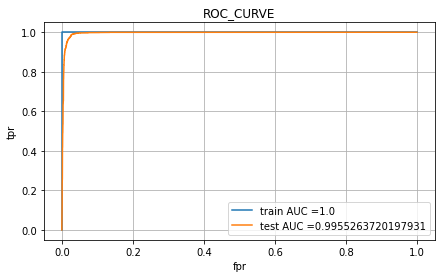

the maximum value of tpr*(1-fpr) 1.0 for threshold 0.989
the maximum value of tpr*(1-fpr) 0.9614116059379216 for threshold 0.05


<Figure size 432x288 with 0 Axes>

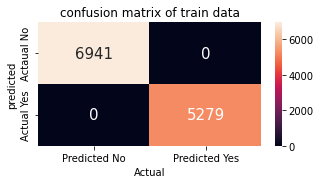

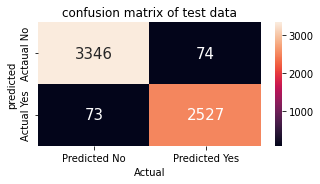

train_auc_score = 1.0
validation_auc_score = 0.9955263720197931
--------------------------------------------------------------------------------------------------------------
logloss Train:-- 9.992007221626413e-16
logloss Test:-- 0.8433985548607492
--------------------------------------------------------------------------------------------------------------
F1 Train:-- 1.0
F1 Test:-- 0.9717362045760431
Accuracy Train:-- 1.0
Accuracy Test:-- 0.9755813953488373


In [ ]:
plot_roc_confusion_matrix_f1(model,X_train_padded,y_train_ac,x_cv_padded,y_cv_ac)

In [ ]:
# saving BERT Model
model.save('best_model/CNN_b_model.h5')

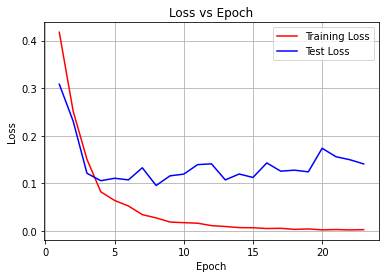

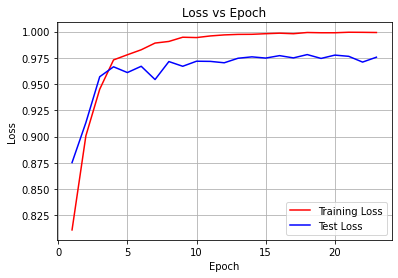

In [ ]:
training_loss = model_cnn_b.history['loss']
test_loss = model_cnn_b.history['val_loss']
train_acc=model_cnn_b.history['accuracy']
test_acc=model_cnn_b.history['val_accuracy']

# Create count of the number of epochs
epoch_count = range(1, len(training_loss) + 1)
plt.figure(1)
# Visualize loss history
plt.plot(epoch_count, training_loss, 'r-',label="Train_loss")
plt.plot(epoch_count, test_loss, 'b-',label='Test_loss')
plt.legend(['Training Loss', 'Test Loss'])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs Epoch')
plt.grid()
plt.show()

plt.figure(2)

# Visualize loss history
plt.plot(epoch_count, train_acc, 'r-',label="Train_accuracy")
plt.plot(epoch_count, test_acc, 'b-',label='Test_accuracy')
plt.legend(['Training Loss', 'Test Loss'])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs Accuracy')
plt.grid()
plt.show()

In [ ]:
CNN_b_model=tf.keras.models.load_model("best_model/CNN_b_model.h5")
CNN_b_predictions=Test_prediction(CNN_b_model,x_test_padded)
X_test_data['label']=CNN_b_predictions
sub_NN=X_test_data[['id','label']]
sub_NN.to_csv('sub_CNN_b.csv',index=False)

submission screenshot
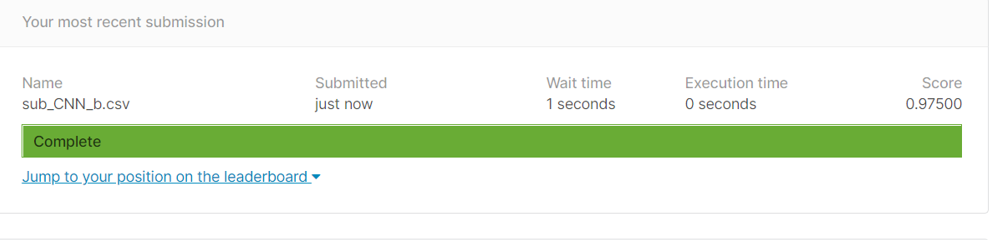

### Model_5 Lstm

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 1014)]            0         
                                                                 
 embeddingLayer (Embedding)  (None, 1014, 300)         74001300  
                                                                 
 lstm (LSTM)                 (None, 1014, 100)         160400    
                                                                 
 flatten_2 (Flatten)         (None, 101400)            0         
                                                                 
 dropout_1 (Dropout)         (None, 101400)            0         
                                                                 
 dense_6 (Dense)             (None, 512)               51917312  
                                                                 
 dense_7 (Dense)             (None, 256)               1313

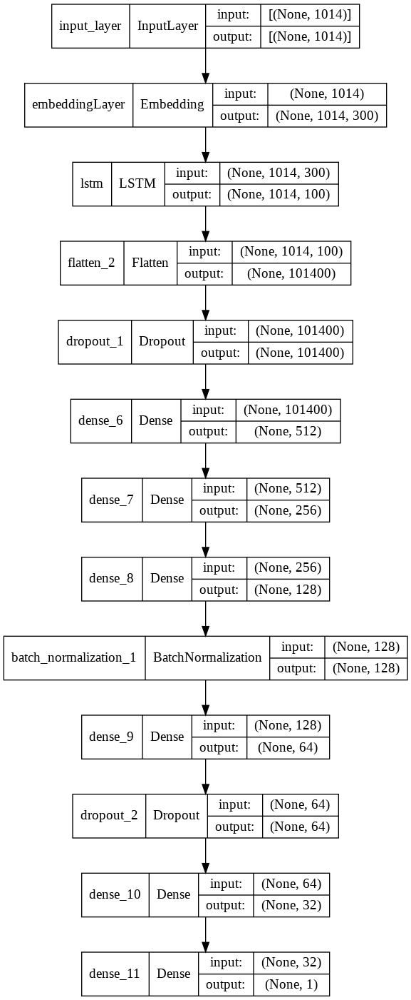

In [17]:
input = Input(shape=(1014,),name='input_layer')
# embedding layer
embeddings = tf.keras.layers.Embedding(vocab_size, 300,
                       weights=[embedding_matrix],
                       input_length=1014,
                       trainable=False,
                       name="embeddingLayer")(input)

lstm_embeddings = tf.keras.layers.LSTM(100,return_sequences=True)(embeddings) 

flatten_layer_lstm=tf.keras.layers.Flatten()(lstm_embeddings)

dropout_layer=tf.keras.layers.Dropout(0.4)(flatten_layer_lstm)
layer1 = Dense(512,activation='relu',kernel_initializer=tf.keras.initializers.HeNormal())(dropout_layer)
layer2 = Dense(256,activation='relu',kernel_initializer=tf.keras.initializers.HeNormal())(layer1)
layer3 = Dense(128,activation='relu',kernel_initializer=tf.keras.initializers.HeNormal())(layer2)
batch_n=tf.keras.layers.BatchNormalization()(layer3)
layer4 = Dense(64,activation='relu',kernel_initializer=tf.keras.initializers.HeNormal())(batch_n)
dropout_layer_1=tf.keras.layers.Dropout(0.2)(layer4)
layer5 = Dense(32,activation='relu',kernel_initializer=tf.keras.initializers.HeNormal())(dropout_layer_1)



#output layer
output = Dense(1,activation='sigmoid',kernel_initializer=tf.keras.initializers.glorot_normal(seed=0))(layer5)
#Creating a model
model = Model(inputs=input,outputs=output)
optimizer = tf.keras.optimizers.Adam(
    learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07)



#save model
filepath="best_model/best_model_Lstm.h5"
model_checkpoint = tf.keras.callbacks.ModelCheckpoint(
    filepath=filepath,
    save_weights_only=True,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True)



#tensorboard
log_dir="logs_model_Lstm :-"+ datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir,histogram_freq=1, 
                                                      write_graph=True,write_grads=True)


# callback_list=[reduce_lr_1,lr_scheduler_2,model_checkpoint,early_stop,tensorboard_callback]
def learning_rate_change(epoch, lr):
    
    if epoch % 3 == 0:
        return lr * 0.95
    else:
        return lr
#learing rate condition 1
reduce_lr_1 = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_accuracy', factor=0.9,
                              patience=0, min_lr=0.0001)

lr_scheduler_2 = tf.keras.callbacks.LearningRateScheduler(learning_rate_change, verbose=3)

#early stoping
early_stop=tf.keras.callbacks.EarlyStopping(
    monitor='val_accuracy', min_delta=0, patience=3, verbose=3,
    mode='auto', baseline=None, restore_best_weights=False)

callback_list=[reduce_lr_1,lr_scheduler_2,early_stop,model_checkpoint]




model.compile(optimizer=optimizer, loss="binary_crossentropy",metrics=['accuracy'])
print(model.summary())

dot_img_file = '/model_Lstm.png'
tf.keras.utils.plot_model(model, to_file=dot_img_file, show_shapes=True)


In [18]:
model_lstm=model.fit(X_train_padded,y_train_ac,epochs=50, validation_data=(x_cv_padded,y_cv_ac), batch_size=15,callbacks=callback_list)


Epoch 00001: LearningRateScheduler setting learning rate to 0.0009500000451225787.
Epoch 1/50
815/815 [==============================] - 158s 191ms/step - loss: 0.4571 - accuracy: 0.7863 - val_loss: 1.5947 - val_accuracy: 0.4935 - lr: 9.5000e-04

Epoch 00002: LearningRateScheduler setting learning rate to 0.0009500000160187483.
Epoch 2/50
815/815 [==============================] - 147s 180ms/step - loss: 0.2841 - accuracy: 0.8890 - val_loss: 0.1895 - val_accuracy: 0.9292 - lr: 9.5000e-04

Epoch 00003: LearningRateScheduler setting learning rate to 0.0009500000160187483.
Epoch 3/50
815/815 [==============================] - 147s 180ms/step - loss: 0.1800 - accuracy: 0.9324 - val_loss: 0.1325 - val_accuracy: 0.9527 - lr: 9.5000e-04

Epoch 00004: LearningRateScheduler setting learning rate to 0.0009025000152178108.
Epoch 4/50
815/815 [==============================] - 145s 178ms/step - loss: 0.1178 - accuracy: 0.9557 - val_loss: 1.3524 - val_accuracy: 0.6615 - lr: 8.1225e-04

Epoch 00005

<Figure size 432x288 with 0 Axes>

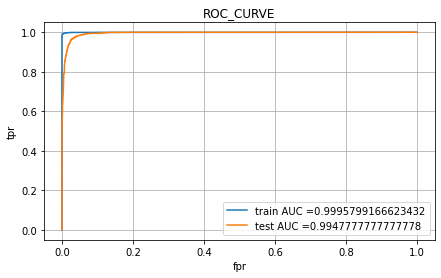

the maximum value of tpr*(1-fpr) 0.9900325693197548 for threshold 0.991
the maximum value of tpr*(1-fpr) 0.9396365272154745 for threshold 0.979


<Figure size 432x288 with 0 Axes>

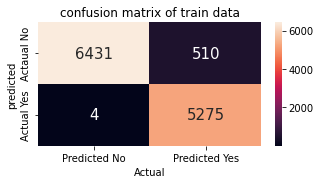

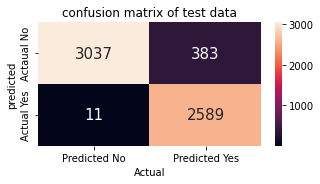

train_auc_score = 0.9995799166623432
validation_auc_score = 0.9947777777777778
--------------------------------------------------------------------------------------------------------------
logloss Train:-- 1.4528100541467674
logloss Test:-- 2.2605621504004283
--------------------------------------------------------------------------------------------------------------
F1 Train:-- 0.9535430224150397
F1 Test:-- 0.929289303661163
Accuracy Train:-- 0.9579378068739771
Accuracy Test:-- 0.9345514950166113


In [19]:
plot_roc_confusion_matrix_f1(model,X_train_padded,y_train_ac,x_cv_padded,y_cv_ac)

In [20]:
# saving BERT Model
model.save('best_model/Lstm_model.h5')

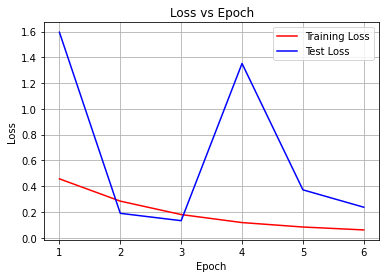

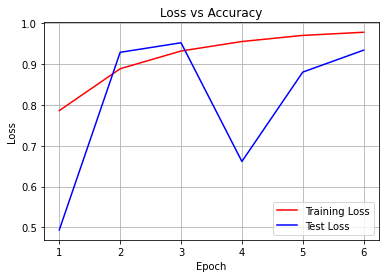

In [21]:
training_loss = model_lstm.history['loss']
test_loss = model_lstm.history['val_loss']
train_acc=model_lstm.history['accuracy']
test_acc=model_lstm.history['val_accuracy']

# Create count of the number of epochs
epoch_count = range(1, len(training_loss) + 1)
plt.figure(1)
# Visualize loss history
plt.plot(epoch_count, training_loss, 'r-',label="Train_loss")
plt.plot(epoch_count, test_loss, 'b-',label='Test_loss')
plt.legend(['Training Loss', 'Test Loss'])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs Epoch')
plt.grid()
plt.show()

plt.figure(2)

# Visualize loss history
plt.plot(epoch_count, train_acc, 'r-',label="Train_accuracy")
plt.plot(epoch_count, test_acc, 'b-',label='Test_accuracy')
plt.legend(['Training Loss', 'Test Loss'])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs Accuracy')
plt.grid()
plt.show()

In [22]:
lstm_model=tf.keras.models.load_model("best_model/Lstm_model.h5")
lstm_predictions=Test_prediction(lstm_model,x_test_padded)
X_test_data['label']=lstm_predictions
sub_NN=X_test_data[['id','label']]
sub_NN.to_csv('sum_lstm.csv',index=False)

Submission screenshot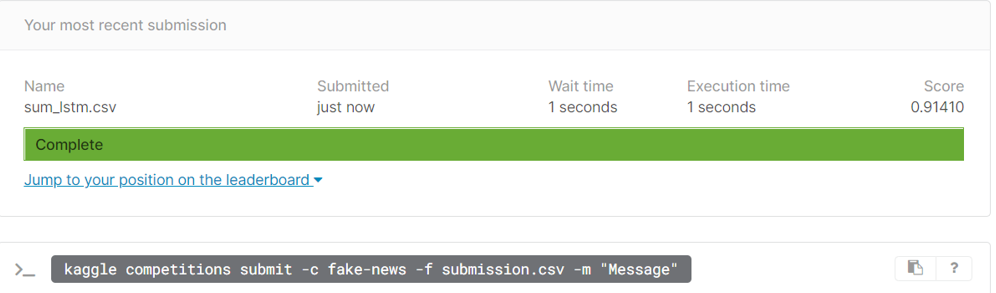

### Model_6 Cnn+lstm

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_layer (InputLayer)       [(None, 1014)]       0           []                               
                                                                                                  
 embeddingLayer (Embedding)     (None, 1014, 300)    74001300    ['input_layer[0][0]']            
                                                                                                  
 conv_1d_1 (Conv1D)             (None, 1012, 5)      4505        ['embeddingLayer[0][0]']         
                                                                                                  
 conv_1d_2 (Conv1D)             (None, 1012, 10)     9010        ['embeddingLayer[0][0]']         
                                                                                              

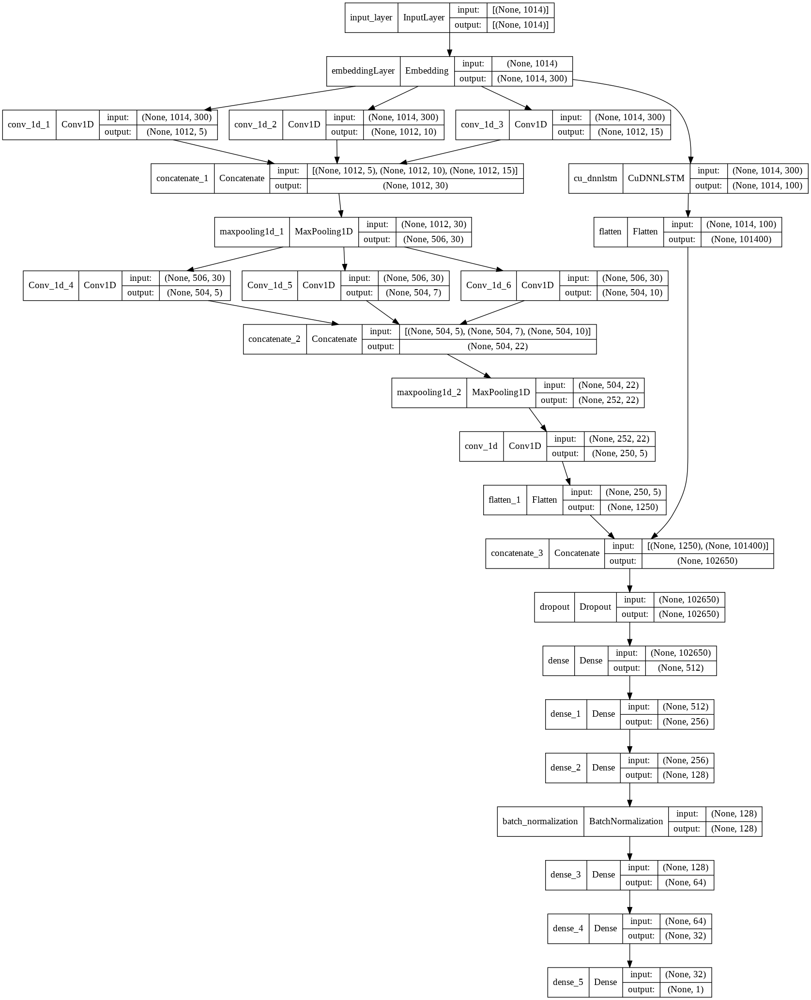

In [8]:
# input layer
input_m = Input(shape=(1014,),name='input_layer')
# embedding layer
embeddings = tf.keras.layers.Embedding(vocab_size, 300,
                       weights=[embedding_matrix],
                       input_length=1014,
                       trainable=False,
                       name="embeddingLayer")(input_m)

lstm_embeddings = tf.compat.v1.keras.layers.CuDNNLSTM(100,return_sequences=True)(embeddings) 

flatten_layer_lstm=tf.keras.layers.Flatten()(lstm_embeddings)

conv_1d_1 = tf.keras.layers.Conv1D(filters=5,
                   kernel_size = 3,
                   activation='relu',
                   name="conv_1d_1")(embeddings)
conv_1d_2 = tf.keras.layers.Conv1D(filters=10,
                   kernel_size = 3,
                   activation='relu',
                   name="conv_1d_2")(embeddings)
conv_1d_3 = tf.keras.layers.Conv1D(filters=15,
                   kernel_size = 3,
                   activation='relu',
                   name="conv_1d_3")(embeddings)
# https://intellipaat.com/community/3409/how-to-concatenate-two-layers-in-keras
concatenate_1 = tf.keras.layers.Concatenate(name="concatenate_1")([conv_1d_1,conv_1d_2,conv_1d_3])
maxpooling_1 = tf.keras.layers.MaxPool1D(name="maxpooling1d_1")(concatenate_1)
conv_1d_4 = tf.keras.layers.Conv1D(filters=5,
                   kernel_size = 3,
                   activation='relu',
                   name="Conv_1d_4")(maxpooling_1)
conv_1d_5 = tf.keras.layers.Conv1D(filters=7,
                   kernel_size = 3,
                   activation='relu',
                   name="Conv_1d_5")(maxpooling_1)
conv_1d_6 = tf.keras.layers.Conv1D(filters=10,
                   kernel_size = 3,
                   activation='relu',
                   name="Conv_1d_6")(maxpooling_1)
concatenate_2 = tf.keras.layers.Concatenate(name="concatenate_2")([conv_1d_4,conv_1d_5,conv_1d_6])
maxpooling_2 = tf.keras.layers.MaxPool1D(name="maxpooling1d_2")(concatenate_2)
conv_1d= tf.keras.layers.Conv1D(filters=5,
                   kernel_size = 3,
                   activation='relu',
                   name="conv_1d")(maxpooling_2)
flatten_layer=tf.keras.layers.Flatten()(conv_1d)
concatenate_3 = tf.keras.layers.Concatenate(name="concatenate_3")([flatten_layer,flatten_layer_lstm])
dropout_layer=tf.keras.layers.Dropout(0.1)(concatenate_3)
layer1 = Dense(512,activation='relu',kernel_initializer=tf.keras.initializers.HeNormal())(dropout_layer)
layer2 = Dense(256,activation='relu',kernel_initializer=tf.keras.initializers.HeNormal())(layer1)
layer3 = Dense(128,activation='relu',kernel_initializer=tf.keras.initializers.HeNormal())(layer2)
batch_n=tf.keras.layers.BatchNormalization()(layer3)
layer4 = Dense(64,activation='relu',kernel_initializer=tf.keras.initializers.HeNormal())(batch_n)
layer5 = Dense(32,activation='relu',kernel_initializer=tf.keras.initializers.HeNormal())(layer4)



#output layer
output = Dense(1,activation='sigmoid',kernel_initializer=tf.keras.initializers.glorot_normal(seed=0))(layer5)
#Creating a model
model = Model(inputs=input_m,outputs=output)
optimizer = tf.keras.optimizers.Adam(
    learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07)



#save model
filepath="best_model/best_model_Lstm_cnn.h5"
model_checkpoint = tf.keras.callbacks.ModelCheckpoint(
    filepath=filepath,
    save_weights_only=True,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True)



#tensorboard
log_dir="logs_model_Lstm_cnn :-"+ datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir,histogram_freq=1, 
                                                      write_graph=True,write_grads=True)


# callback_list=[reduce_lr_1,lr_scheduler_2,model_checkpoint,early_stop,tensorboard_callback]
def learning_rate_change(epoch, lr):
    
    if epoch % 3 == 0:
        return lr * 0.95
    else:
        return lr
#learing rate condition 1
reduce_lr_1 = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_accuracy', factor=0.9,
                              patience=0, min_lr=0.0001)

lr_scheduler_2 = tf.keras.callbacks.LearningRateScheduler(learning_rate_change, verbose=3)

#early stoping
early_stop=tf.keras.callbacks.EarlyStopping(
    monitor='val_accuracy', min_delta=0, patience=3, verbose=3,
    mode='auto', baseline=None, restore_best_weights=False)

callback_list=[reduce_lr_1,lr_scheduler_2,early_stop,model_checkpoint]




model.compile(optimizer=optimizer, loss="binary_crossentropy",metrics=['accuracy'])
print(model.summary())

dot_img_file = '/model_Lstm_cnn.png'
tf.keras.utils.plot_model(model, to_file=dot_img_file, show_shapes=True)




In [9]:
model_lstm_cnn=model.fit(X_train_padded,y_train_ac,epochs=50, validation_data=(x_cv_padded,y_cv_ac), batch_size=15,callbacks=callback_list)


Epoch 00001: LearningRateScheduler setting learning rate to 0.0009500000451225787.
Epoch 1/50
815/815 [==============================] - 173s 198ms/step - loss: 0.3706 - accuracy: 0.8355 - val_loss: 0.2672 - val_accuracy: 0.9066 - lr: 9.5000e-04

Epoch 00002: LearningRateScheduler setting learning rate to 0.0009500000160187483.
Epoch 2/50
815/815 [==============================] - 161s 197ms/step - loss: 0.1894 - accuracy: 0.9281 - val_loss: 0.1562 - val_accuracy: 0.9490 - lr: 9.5000e-04

Epoch 00003: LearningRateScheduler setting learning rate to 0.0009500000160187483.
Epoch 3/50
815/815 [==============================] - 158s 194ms/step - loss: 0.1435 - accuracy: 0.9467 - val_loss: 0.1813 - val_accuracy: 0.9231 - lr: 8.5500e-04

Epoch 00004: LearningRateScheduler setting learning rate to 0.0008122499915771186.
Epoch 4/50
815/815 [==============================] - 161s 197ms/step - loss: 0.0691 - accuracy: 0.9748 - val_loss: 0.1040 - val_accuracy: 0.9630 - lr: 8.1225e-04

Epoch 00005

<Figure size 432x288 with 0 Axes>

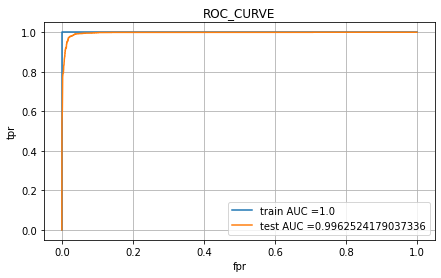

the maximum value of tpr*(1-fpr) 1.0 for threshold 0.517
the maximum value of tpr*(1-fpr) 0.9562516869095816 for threshold 0.995


<Figure size 432x288 with 0 Axes>

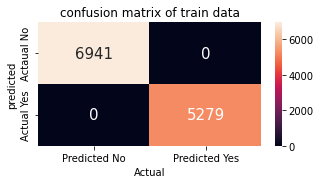

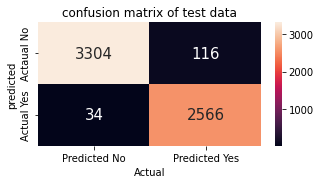

train_auc_score = 1.0
validation_auc_score = 0.9962524179037336
--------------------------------------------------------------------------------------------------------------
logloss Train:-- 9.992007221626413e-16
logloss Test:-- 0.860616148262211
--------------------------------------------------------------------------------------------------------------
F1 Train:-- 1.0
F1 Test:-- 0.9716016660355926
Accuracy Train:-- 1.0
Accuracy Test:-- 0.9750830564784053


In [10]:
plot_roc_confusion_matrix_f1(model,X_train_padded,y_train_ac,x_cv_padded,y_cv_ac)

In [13]:
# saving BERT Model
model.save('best_model/Lstm_cnn_model.h5')

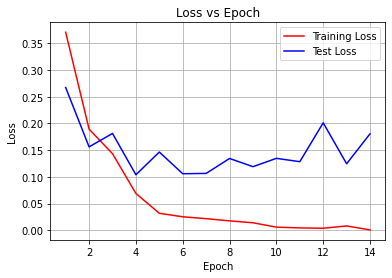

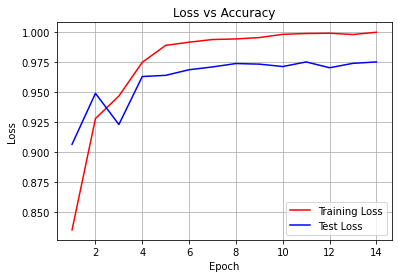

In [12]:
training_loss = model_lstm_cnn.history['loss']
test_loss = model_lstm_cnn.history['val_loss']
train_acc=model_lstm_cnn.history['accuracy']
test_acc=model_lstm_cnn.history['val_accuracy']

# Create count of the number of epochs
epoch_count = range(1, len(training_loss) + 1)
plt.figure(1)
# Visualize loss history
plt.plot(epoch_count, training_loss, 'r-',label="Train_loss")
plt.plot(epoch_count, test_loss, 'b-',label='Test_loss')
plt.legend(['Training Loss', 'Test Loss'])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs Epoch')
plt.grid()
plt.show()

plt.figure(2)

# Visualize loss history
plt.plot(epoch_count, train_acc, 'r-',label="Train_accuracy")
plt.plot(epoch_count, test_acc, 'b-',label='Test_accuracy')
plt.legend(['Training Loss', 'Test Loss'])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs Accuracy')
plt.grid()
plt.show()

In [16]:
lstm_cnn_model=tf.keras.models.load_model("best_model/Lstm_cnn_model.h5")
lstm_cnn_predictions=Test_prediction(lstm_cnn_model,x_test_padded)
X_test_data['label']=lstm_cnn_predictions
sub_NN=X_test_data[['id','label']]
sub_NN.to_csv('sum_lstm_cnn.csv',index=False)

Submission Screenshot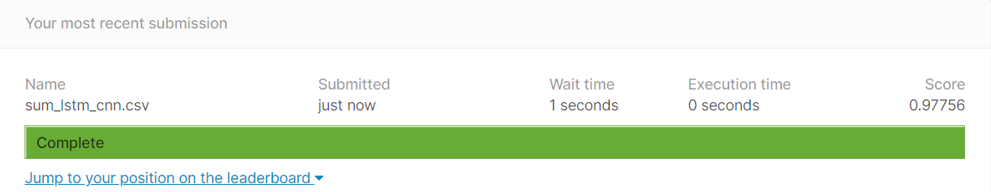

##  Model comparision

In [3]:
from prettytable import PrettyTable
ptable = PrettyTable()


ptable.title = "Comparision Between Different Models on Test Accuracy"

ptable.field_names = ["Model",'Test Accuracy']
ptable.add_row(['Model_1: BERT Embeddings','0.79038'])
ptable.add_row(["\n","\n"])
ptable.add_row(['Model_2: Neural Network','0.83717'])
ptable.add_row(["\n","\n"])
ptable.add_row(['Model_3: CNN_a','0.87984'])
ptable.add_row(["\n","\n"])
ptable.add_row(['Model_4: CNN_b','0.97500',])
ptable.add_row(["\n","\n"])
ptable.add_row(['Model_5: LSTM','0.91410'])
ptable.add_row(["\n","\n"])
ptable.add_row(['Model_6: CNN + LSTM','0.97756'])

print(ptable)

+-------------------------------------------------------+
| Comparision Between Different Models on Test Accuracy |
+----------------------------------+--------------------+
|              Model               |   Test Accuracy    |
+----------------------------------+--------------------+
|     Model_1: BERT Embeddings     |      0.79038       |
|                                  |                    |
|                                  |                    |
|     Model_2: Neural Network      |      0.83717       |
|                                  |                    |
|                                  |                    |
|          Model_3: CNN_a          |      0.87984       |
|                                  |                    |
|                                  |                    |
|          Model_4: CNN_b          |      0.97500       |
|                                  |                    |
|                                  |                    |
|          Mod

#### Conclusion
Model_6 convolution neural network pluse LSTM gives the best test accuracy,
so we will move further with model_6.

## Evaluating Best Model

Our main Aim is here to find why our model is  predicting False postivies (Non fake news to fake news) and False negatives (fake news to Non fake news) label. 

To answer this question here we are checking the distribution of the featues which are False positive or False Negative by Positive labeled data (only fake news data) and Negative Labeled data(only non-fake news data) respectively to understand the behaviour of the model.

In [11]:
train_pre=pd.read_csv('train_pre.csv')

In [12]:
train_pre.head()

,id,title,author,text,label,pre_text,pre_title,pre_author,merged
0,0,House Dem Aide: We Didn’t Even See Comey’s Let...,Darrell Lucus,House Dem Aide: We Didn’t Even See Comey’s Let...,1,house dem aide even see comey letter jason cha...,house dem aide even see comey letter jason cha...,darrell lucus,house dem aide even see comey letter jason cha...
1,1,"FLYNN: Hillary Clinton, Big Woman on Campus - ...",Daniel J. Flynn,Ever get the feeling your life circles the rou...,0,ever get feeling life circles roundabout rathe...,flynn hillary clinton big woman campus breitbart,danielflynn,ever get feeling life circles roundabout rathe...
2,2,Why the Truth Might Get You Fired,Consortiumnews.com,"Why the Truth Might Get You Fired October 29, ...",1,truth might get fired october tension intellig...,truth might get fired,consortiumnews com,truth might get fired october tension intellig...
3,3,15 Civilians Killed In Single US Airstrike Hav...,Jessica Purkiss,Videos 15 Civilians Killed In Single US Airstr...,1,videos civilians killed singleairstrike identi...,civilians killed singleairstrike identified,jessica purkiss,videos civilians killed singleairstrike identi...
4,4,Iranian woman jailed for fictional unpublished...,Howard Portnoy,Print \nAn Iranian woman has been sentenced to...,1,print iranian woman sentenced six years prison...,iranian woman jailed fictional unpublished sto...,howard portnoy,print iranian woman sentenced six years prison...


In [15]:
train_pre['len_merged']=train_pre['merged'].apply(lambda x: len(str(x)))

In [17]:
train_pre['len_merged'].head()

0    3283
1    2785
2    5231
3    2223
4     750
Name: len_merged, dtype: int64

In [26]:
train_pre['merged']=train_pre['merged'].astype('str')
#tokenization and padding
encode_text_train=token_glove.texts_to_sequences(train_pre['merged'])
max_length=int(1014)  # 95 precentile of the words in X_train.
encode_text_train_paded=tf.keras.preprocessing.sequence.pad_sequences(encode_text_train, maxlen=max_length, padding='post')

In [28]:
# predicting
lstm_cnn_model=tf.keras.models.load_model("best_model/Lstm_cnn_model.h5")
lstm_cnn_predictions=Test_prediction(lstm_cnn_model,encode_text_train_paded)
train_pre['label_pred']=lstm_cnn_predictions

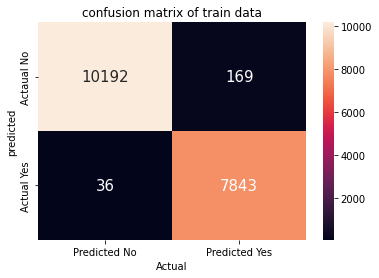

In [29]:
conf_mat = pd.DataFrame(confusion_matrix(train_pre['label'], train_pre['label_pred']))

sns.heatmap(conf_mat, annot = True, fmt= 'd',annot_kws={"size": 15}, xticklabels= ['Predicted No', 'Predicted Yes'], yticklabels= ['Actaual No','Actual Yes'])
plt.title('confusion matrix of train data')
plt.xlabel('Actual')
plt.ylabel('predicted')
plt.show()

In [31]:
# sepating diffrent dataframe based on its predicted and actual label
False_negative_df=train_pre.loc[(train_pre['label'] ==1) & (train_pre['label_pred']==0)]
false_positive_df=train_pre.loc[(train_pre['label'] ==0) & (train_pre['label_pred']==1)]
positive_df=train_pre.loc[(train_pre['label'] ==1)]
negative_df=train_pre.loc[(train_pre['label'] ==0)]

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


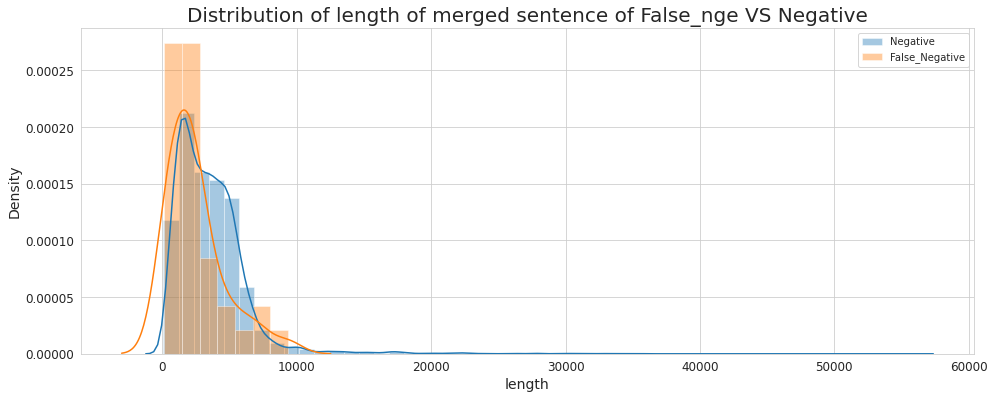

In [32]:
plt.figure(figsize=(16,6)) # hight and width of plot 
sns.set_style('whitegrid') # backgroud of plot 
sns.distplot(negative_df['len_merged'],label='Negative')
sns.distplot(False_negative_df['len_merged'],label='False_Negative')
plt.xticks(size = 12) # size of x axis indicators(yes/no)
plt.yticks(size = 12)
plt.legend()
plt.title('Distribution of length of merged sentence of False_nge VS Negative', fontsize=20)
plt.xlabel('length', size = 14)
plt.ylabel('Density', size = 14)
plt.show()

Observations
1. we can see that distribution of false negative and negative is almost same

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


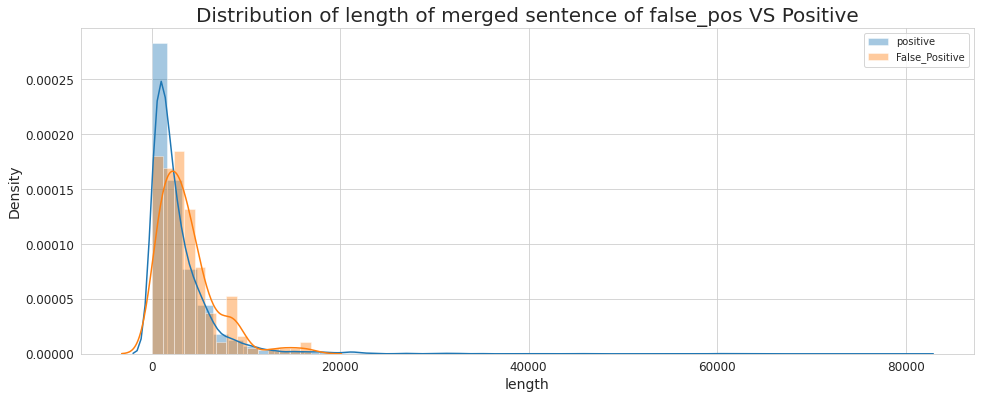

In [33]:
plt.figure(figsize=(16,6)) # hight and width of plot 
sns.set_style('whitegrid') # backgroud of plot 
sns.distplot(positive_df['len_merged'],label='positive')
sns.distplot(false_positive_df['len_merged'],label='False_Positive')
plt.xticks(size = 12) # size of x axis indicators(yes/no)
plt.yticks(size = 12)
plt.legend()
plt.title('Distribution of length of merged sentence of false_pos VS Positive', fontsize=20)
plt.xlabel('length', size = 14)
plt.ylabel('Density', size = 14)
plt.show()

### common author

In [40]:
author_name_neg=set(negative_df['pre_author'])
f_n_author_name=set(False_negative_df['pre_author'])

In [41]:
check=author_name_neg & f_n_author_name # getting common names

In [42]:
check

{'davidsanger', 'pam key'}

####observations
we can see that non fake news and false predicted fake news has common author name Therefore our model has some errors

In [43]:
author_name_pos=set(positive_df['pre_author'])
f_p_author_name=set(false_positive_df['pre_author'])
check_1=author_name_pos & f_p_author_name # getting common names

In [44]:
print(check_1)

{' ', 'ann coulter', 'pamela geller'}


####observations
we can see that  fake news and false predicted non fake news has common author name Therefore our model has some errors